<a href="https://www.kaggle.com/code/mennatallah77/motorcycle-accident-video-classification?scriptVersionId=201347875" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [90]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report,confusion_matrix,ConfusionMatrixDisplay

import tensorflow as tf
from tensorflow.keras.applications import VGG19,MobileNet
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM,Dense,TimeDistributed,GlobalAveragePooling2D,Dropout,BatchNormalization
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam,Adamax,AdamW
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint

from IPython.display import Video
import random
import cv2
import os

## 📽Display a video from each category📽

In [18]:
Video("/kaggle/input/motorcycle-accident-video-dataset/train/train/accident_000.mp4", embed=True,width=400, height=400)

In [19]:
Video("/kaggle/input/motorcycle-accident-video-dataset/train/train/driving_00105.mp4", embed=True,width=400, height=400)

## 🖼Frames preparation🖼

In [20]:
SEQUENCE = 20

In [21]:
def load_video(path, seq_length=SEQUENCE, skip_frames=1):
    frames = []
    cap = cv2.VideoCapture(path)

    for _ in range(seq_length):
        ret, frame = cap.read()  # Read the current frame
        if not ret:
            break

        # Process the current frame (resize, convert, normalize)
        frame = cv2.resize(frame, (128, 128))
        frame = frame[:, :, [2, 1, 0]]  # BGR to RGB
        frame = frame / 255.0
        frames.append(frame)

        # Skip the specified number of frames
        for _ in range(skip_frames):
            cap.grab()  # Advance to the next frame without reading it

    cap.release()  # Release the video capture object
    return frames


def extract_frames(video_directory):
    features = []
    labels = []
    for filename in os.listdir(video_directory): 
        if filename.endswith(('.mp4', '.avi', '.mov')): 
            video_path = os.path.join(video_directory, filename)
            
            # Load and process the video
            frames = load_video(video_path)
            
            if len(frames) == SEQUENCE:
                features.append(frames)
                labels.append(filename.split('_')[0])
    return np.asarray(features),np.array(labels)
                

In [22]:
features,labels= extract_frames('/kaggle/input/motorcycle-accident-video-dataset/train/train')

In [23]:
features.shape,labels.shape

((136, 20, 128, 128, 3), (136,))

In [24]:
np.unique(labels)

array(['accident', 'driving'], dtype='<U8')

In [25]:
encoder = LabelEncoder()
labels = encoder.fit_transform(labels)

## 🪓Splitting🪓

In [26]:
X_train,X_,y_train,y_ = train_test_split(features,labels,test_size=0.2,random_state=42,stratify=labels)
X_test,X_val,y_test,y_val = train_test_split(X_,y_,test_size=0.5,random_state=42,stratify=y_)

## 🌟Model (Pre-trained CNN + LSTM)🌟

In [74]:
base_model = MobileNet(weights='imagenet', include_top=False, input_shape=(128, 128, 3))


for layer in base_model.layers:
    layer.trainable = False


model = Sequential()
model.add(TimeDistributed(base_model, input_shape=(20, 128, 128, 3)))
model.add(TimeDistributed(GlobalAveragePooling2D())) 
model.add(TimeDistributed(Dropout(0.5)))
model.add(TimeDistributed(BatchNormalization()))

model.add(LSTM(64, return_sequences=False))

model.add(Dense(128, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(Dense(64, activation='relu'))
model.add(Dense(1, activation='sigmoid'))  

model.compile(optimizer=Adam(learning_rate=1e-3), loss='binary_crossentropy', metrics=['accuracy'])

model.summary()

Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ time_distributed_70             │ ?                      │     3,228,864 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_71             │ ?                      │   0 (unbuilt) │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_72             │ ?                      │   0 (unbuilt) │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_73             │ ?                      │   0 (unbuilt) │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_22 (LSTM)                  │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_63 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_25          │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_41 (Dropout)            │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_64 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,228,864 (12.32 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 3,228,864 (12.32 MB)

In [75]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
checkpoint = ModelCheckpoint(
    '/kaggle/working/best_model.keras',  
    monitor='val_loss',
    save_best_only=True,  
    mode='min',  
)
history = model.fit(
    x=X_train,
    y= y_train,
    validation_data=(X_val,y_val),
    callbacks=[early_stopping,checkpoint],
    epochs= 30,
)

Epoch 1/30

4/4 ━━━━━━━━━━━━━━━━━━━━ 60s 5s/step - accuracy: 0.5036 - loss: 0.8869 - val_accuracy: 0.7647 - val_loss: 0.6141

Epoch 2/30

4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 604ms/step - accuracy: 0.7889 - loss: 0.4577 - val_accuracy: 0.8088 - val_loss: 0.5400

Epoch 3/30

4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 606ms/step - accuracy: 0.8914 - loss: 0.2961 - val_accuracy: 0.8235 - val_loss: 0.4886

Epoch 4/30

4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 598ms/step - accuracy: 0.8921 - loss: 0.2899 - val_accuracy: 0.8971 - val_loss: 0.4508

Epoch 5/30

4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 602ms/step - accuracy: 0.9277 - loss: 0.1704 - val_accuracy: 0.8824 - val_loss: 0.4201

Epoch 6/30

4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 607ms/step - accuracy: 0.9545 - loss: 0.1739 - val_accuracy: 0.8971 - val_loss: 0.3892

Epoch 7/30

4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 605ms/step - accuracy: 0.9664 - loss: 0.1195 - val_accuracy: 0.9118 - val_loss: 0.3569

Epoch 8/30

4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 610ms/step - accuracy: 0.9612 - loss: 0.1106 - val_accuracy: 0.897

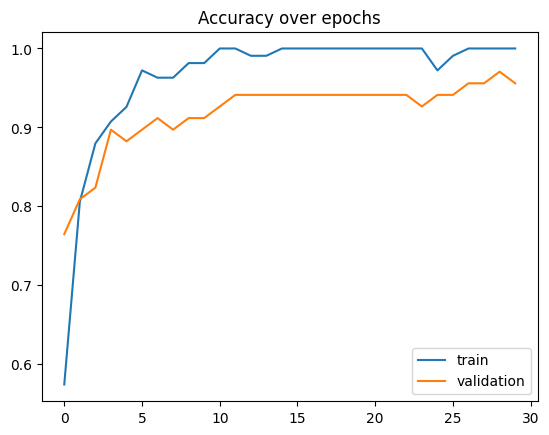

In [88]:
plt.plot(history.history['accuracy'],label='train')
plt.plot(history.history['val_accuracy'],label='validation')
plt.title('Accuracy over epochs')
plt.legend()

***WOW***✨✨

## 📽Videos' Prediction📽

In [89]:
model.evaluate(X_val,y_val)

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - accuracy: 0.9584 - loss: 0.1346


[0.12953712046146393, 0.9558823704719543]

In [77]:
model.evaluate(X_test,y_test)

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - accuracy: 1.0000 - loss: 0.0361


[0.03667416796088219, 1.0]

In [78]:
y_pred_prob = model.predict(X_test)
y_pred = (y_pred_prob > 0.5).astype(int)

3/3 ━━━━━━━━━━━━━━━━━━━━ 23s 6s/step 


              precision    recall  f1-score   support



           0       1.00      1.00      1.00        34

           1       1.00      1.00      1.00        34



    accuracy                           1.00        68

   macro avg       1.00      1.00      1.00        68

weighted avg       1.00      1.00      1.00        68




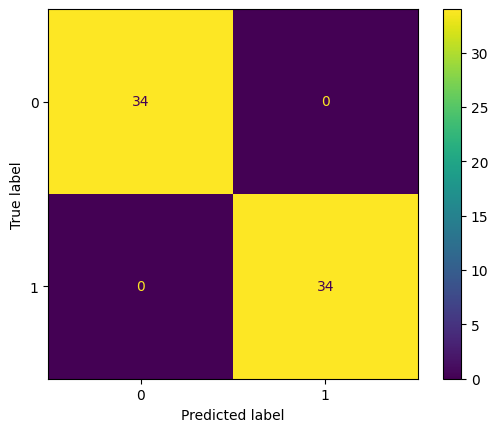

In [79]:
print(classification_report(y_test, y_pred))
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(cm)
disp.plot()

***Thanks***🥂